# Dry Beans classification

## Importing data

In [220]:
import pandas as pd
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sb
import numpy as np
from functools import partial

# bean_data dataframe
df = pd.read_csv("input/bean-data.csv") # there are no missing values
df.head()

classes = df["Class"].unique()
attributes = df.drop(["Class"], axis=1).columns.values

In [45]:
df.describe()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000
mean,53048.284549,855.283459,320.141867,202.270714,1.583242,0.750895,53768.200206,253.064220,0.749733,0.987143,0.873282,0.799864,0.006564,0.001716,0.643590,0.995063
std,29324.095717,214.289696,85.694186,44.970091,0.246678,0.092002,29774.915817,59.177120,0.049086,0.004660,0.059520,0.061713,0.001128,0.000596,0.098996,0.004366
min,20420.000000,524.736000,183.601165,122.512653,1.024868,0.218951,20684.000000,161.243764,0.555315,0.919246,0.489618,0.640577,0.002778,0.000564,0.410339,0.947687
25%,36328.000000,703.523500,253.303633,175.848170,1.432307,0.715928,36714.500000,215.068003,0.718634,0.985670,0.832096,0.762469,0.005900,0.001154,0.581359,0.993703
50%,44652.000000,794.941000,296.883367,192.431733,1.551124,0.764441,45178.000000,238.438026,0.759859,0.988283,0.883157,0.801277,0.006645,0.001694,0.642044,0.996386
75%,61332.000000,977.213000,376.495012,217.031741,1.707109,0.810466,62294.000000,279.446467,0.786851,0.990013,0.916869,0.834270,0.007271,0.002170,0.696006,0.997883
max,254616.000000,1985.370000,738.860153,460.198497,2.430306,0.911423,263261.000000,569.374358,0.866195,0.994677,0.990685,0.987303,0.010451,0.003665,0.974767,0.999733


The variable's description is as follows:

1. Area (`A`): The area of a bean zone and the number of pixels within its
   boundaries.
2. Perimeter (`P`): Bean circumference is defined as the length of its border.
3. Major axis length (`L`): The distance between the ends of the longest line
   that can be drawn from a bean.
4. Minor axis length (`l`): The longest line that can be drawn from the bean
   while standing perpendicular to the main axis.
5. Aspect ratio (`K`): Defines the relationship between L and l.
6. Eccentricity (`Ec`): Eccentricity of the ellipse having the same moments as
   the region.
7. Convex area (`C`): Number of pixels in the smallest convex polygon that can
   contain the area of a bean seed.
8. Equivalent diameter (`Ed`): The diameter of a circle having the same area as
   a bean seed area.
9. Extent (`Ex`): The ratio of the pixels in the bounding box to the bean area.
10. Solidity (`S`): Also known as convexity. The ratio of the pixels in the
    convex shell to those found in beans.
11. Roundness (`R`): Calculated with the following formula:
    `(4 * %pi * A) / (P^2)`
12. Compactness (`CO`): Measures the roundness of an object: `Ed / L`
13. ShapeFactor1 (`SF1`)
14. ShapeFactor2 (`SF2`)
15. ShapeFactor3 (`SF3`)
16. ShapeFactor4 (`SF4`)
17. Class (Seker, Barbunya, Bombay, Cali, Dermosan, Horoz and Sira)

## Checking data

### Missing values

In [112]:
print(df.dtypes)

df.isnull().sum()

Area                 int64
Perimeter          float64
MajorAxisLength    float64
MinorAxisLength    float64
AspectRation       float64
Eccentricity       float64
ConvexArea           int64
EquivDiameter      float64
Extent             float64
Solidity           float64
roundness          float64
Compactness        float64
ShapeFactor1       float64
ShapeFactor2       float64
ShapeFactor3       float64
ShapeFactor4       float64
Class               object
dtype: object


Area               0
Perimeter          0
MajorAxisLength    0
MinorAxisLength    0
AspectRation       0
Eccentricity       0
ConvexArea         0
EquivDiameter      0
Extent             0
Solidity           0
roundness          0
Compactness        0
ShapeFactor1       0
ShapeFactor2       0
ShapeFactor3       0
ShapeFactor4       0
Class              0
dtype: int64

We can see the dataset has no missing values:

- all attributes are numbers
- no attributes have null values

### Population sizes

In [126]:
df.groupby("Class").size()/len(df) * 100.0

Class
BARBUNYA     9.712732
BOMBAY       3.835133
CALI        11.975608
DERMASON    26.052458
HOROZ       14.165014
SEKER       14.892366
SIRA        19.366689
dtype: float64

Some *classes* of beans are under-represented in our dataset, e.g.: BOMBAY only makes up 3.8% of the population. We can also see that 29% of the classes (DERMASON and SIRA out of the 7 *classes*) make up 45% of the dataset.

With this, we can see that the population is unbalanced.

### Scatterplot matrix

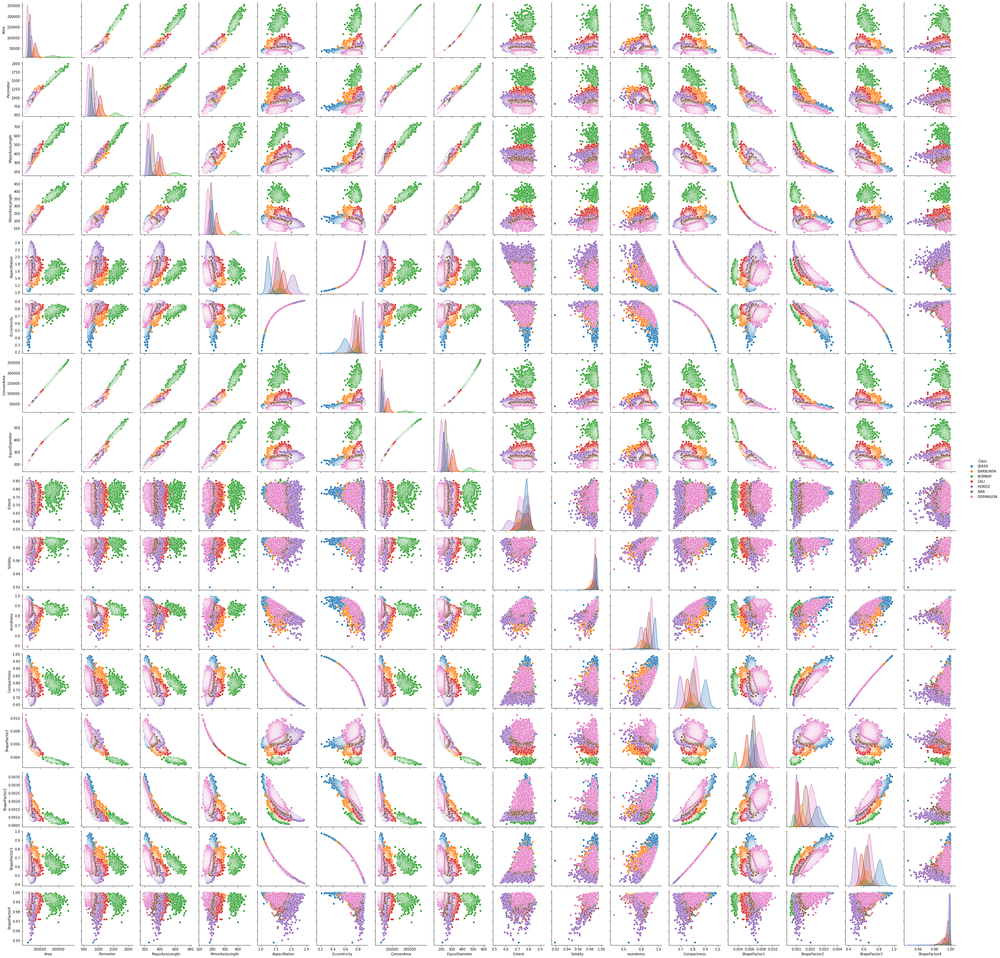

In [4]:
sb.pairplot(df, hue="Class");

From the scatterplot matrix, we can see that:

1. There are 7 classes: Seker, Barbunya, Bombay, Cali, Dermosan, Horoz and Sira. This is what we wanted.
2. The 'BOMBAY' beans (green) tend to be a lot bigger than the other classes. We have to be mindful of this when cleaning outliers.
3. There are many outliers that may be erroneous, e.g.:
    - 1 Area entry for Barbunya
    - 1 Solidity entry for Seker
    - 1 Roundness entry for Dermason

## Tyding data

### Removing outliers

These function divides our dataframe in two: attribute columns and label (class).

In [47]:
# Separate the targe label (y) from the data (X)

# "Area", "Perimeter", "MajorAxisLength", "MinorAxisLength", "AspectRation", "Eccentricity",
# "ConvexArea", "EquivDiameter", "Extent", "Solidity", "roundness", "Compactness", 
# "ShapeFactor1", "ShapeFactor2", "ShapeFactor3", "ShapeFactor4", "Class"

def getXy(df):
    # inputs
    X = df.drop(["Class"], axis=1)
    # target (label)
    y = df["Class"]
    return (X, y)

We'll remove the lines where at least one of the attributes falls outside of 3 standard deviations of that value for that class of beans.

In [70]:
import scipy.stats as stats

X, y = getXy(df)

# find absolute value of z-score for each observation
#z = np.abs(stats.zscore(X))
z = df.groupby('Class')[attributes].apply(lambda x: (x - x.mean())/x.std())

# only keep rows in dataframe with all z-scores less than or equal to the absolute value of 3
df_clean = df[(z.values <= 3).all(axis=1)]
print(df.shape, df_clean.shape)
df_clean.describe()

(13611, 17) (13313, 17)


,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,13313.000000,13313.000000,13313.000000,13313.000000,13313.000000,13313.000000,13313.000000,13313.000000,13313.000000,13313.000000,13313.000000,13313.000000,13313.000000,13313.000000,13313.000000,13313.000000
mean,53049.853001,855.329087,320.329887,202.220762,1.584256,0.751462,53767.931721,253.112836,0.749759,0.987182,0.873523,0.799581,0.006562,0.001713,0.643115,0.995078
std,29209.915400,213.731786,85.590239,44.695736,0.246440,0.091214,29657.546506,58.985799,0.049144,0.004569,0.059156,0.061522,0.001119,0.000594,0.098611,0.004320
min,20464.000000,528.408000,191.176525,133.933207,1.049180,0.302576,20772.000000,161.417391,0.555315,0.943559,0.556766,0.640577,0.002909,0.000564,0.410339,0.949990
25%,36396.000000,703.393000,253.173454,175.987202,1.434016,0.716738,36774.000000,215.269195,0.718632,0.985724,0.832432,0.762621,0.005906,0.001150,0.581591,0.993708
50%,44642.000000,794.513000,297.055548,192.390948,1.551124,0.764441,45164.000000,238.411325,0.759903,0.988294,0.883335,0.801281,0.006647,0.001694,0.642051,0.996382
75%,61491.000000,977.952000,376.900165,216.765256,1.706587,0.810337,62435.000000,279.808457,0.786932,0.990024,0.916873,0.833785,0.007266,0.002170,0.695198,0.997884
max,241322.000000,1921.685000,738.144502,440.686418,2.430306,0.911423,244319.000000,554.311026,0.866195,0.994677,0.990685,0.975895,0.009512,0.003435,0.952371,0.999733


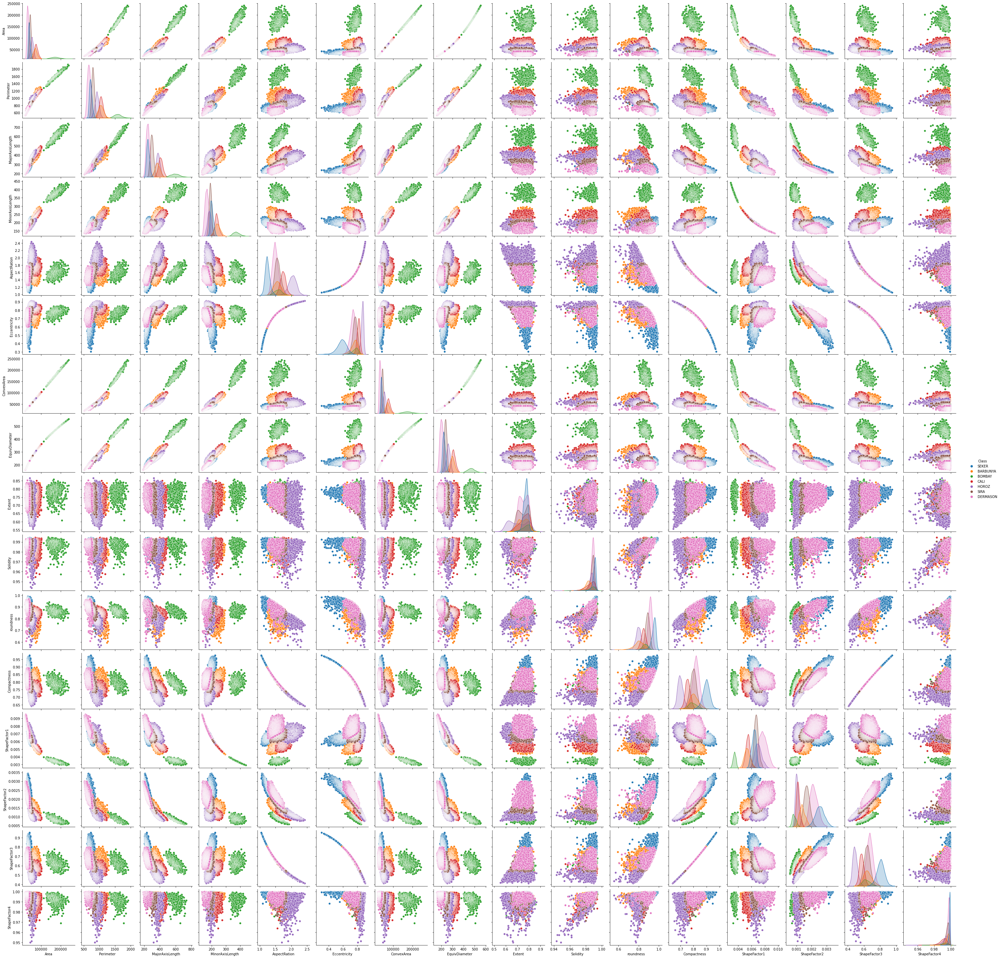

In [67]:
sb.pairplot(df_clean, hue="Class");

Even after this 'clean up', we still have some attributes that are derived (aggregation) and others that are highly correlated. We need to take care of those, in order to simplify the model.

#### Violin plots

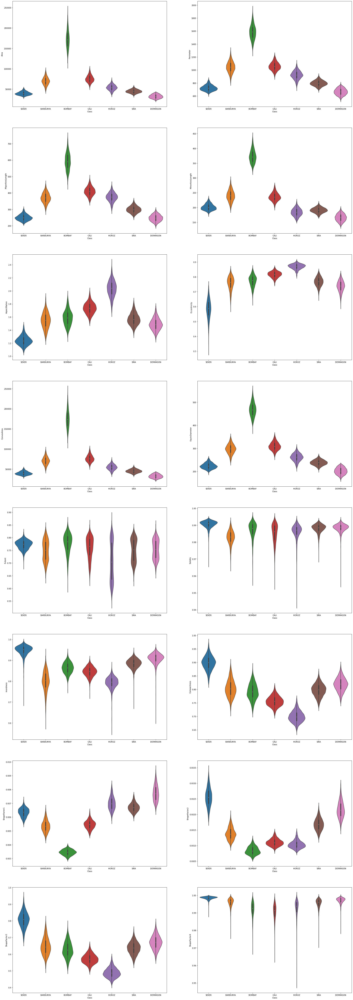

In [77]:
plt.figure(figsize=(32, 96))

for column_index, column in enumerate(df_clean.columns):
    if column == 'Class':
        continue
    plt.subplot(8, 2, column_index + 1)
    sb.violinplot(x='Class', y=column, data=df_clean)

### Feature selection

#### Attribute correlation

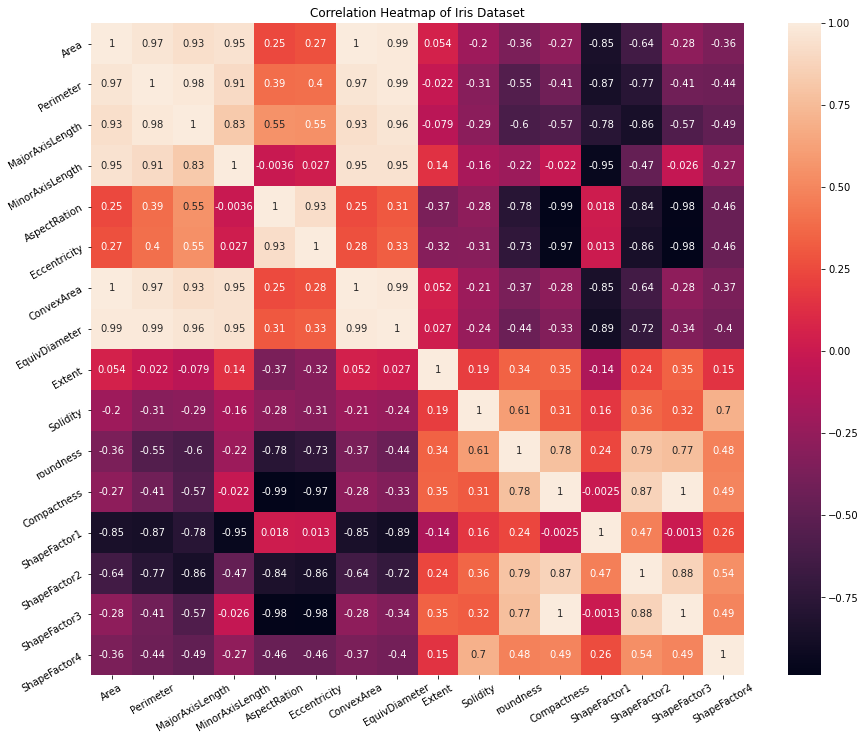

In [78]:
# create correlation matrix
corr_matrix = df_clean.corr();

# create correlation heatmap
plt.figure(figsize=(16.0, 12.0))
plt.title('Correlation Heatmap of Iris Dataset')
a = sb.heatmap(corr_matrix, square=True, annot=True, fmt='.2g', linecolor='black');
a.set_xticklabels(a.get_xticklabels(), rotation=30)
a.set_yticklabels(a.get_yticklabels(), rotation=30)
plt.show();

If the correlation between two features is greater than 0 this means that increasing the values in one
feature will cause an increase of the in the other feature (the closer the correlation coefficient is
to 1 and the stronger is going to be this bond between the two different features).

Correlations lesser than 0 mean increasing the value will cause a decrease of the value of the other feature.

In [80]:
# select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
upper

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
Area,NaN,0.967063,0.932128,0.952161,0.246360,0.273602,0.999941,0.985202,0.053511,-0.203670,-0.364286,-0.273403,-0.850110,-0.642006,-0.277675,-0.362309
Perimeter,NaN,NaN,0.977764,0.913300,0.390747,0.398440,0.968032,0.991570,-0.021823,-0.311456,-0.553683,-0.413145,-0.865695,-0.770460,-0.414955,-0.436170
MajorAxisLength,NaN,NaN,NaN,0.826689,0.554347,0.547510,0.932920,0.961989,-0.078733,-0.294085,-0.604822,-0.572990,-0.775072,-0.861088,-0.572962,-0.490654
MinorAxisLength,NaN,NaN,NaN,NaN,-0.003587,0.026736,0.951917,0.948604,0.144940,-0.162231,-0.215617,-0.021516,-0.948072,-0.473994,-0.026004,-0.269457
AspectRation,NaN,NaN,NaN,NaN,NaN,0.925129,0.247944,0.308959,-0.369561,-0.276609,-0.775624,-0.987710,0.018475,-0.839851,-0.978625,-0.457202
Eccentricity,NaN,NaN,NaN,NaN,NaN,NaN,0.275411,0.325535,-0.319295,-0.309736,-0.734157,-0.970938,0.012798,-0.863057,-0.981592,-0.458344
ConvexArea,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.985483,0.051729,-0.213180,-0.368756,-0.275278,-0.850144,-0.643623,-0.279576,-0.368535
EquivDiameter,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.027318,-0.240549,-0.443648,-0.333708,-0.893680,-0.715542,-0.336643,-0.400070
Extent,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.193938,0.344104,0.353637,-0.140729,0.238143,0.347075,0.150086
Solidity,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.606376,0.313633,0.161986,0.356182,0.317928,0.699064


#### ANOVA test

We can see that we have attributes that are too correlated (absolute value greater than 0.9) with each other, which is bad. We'll use the ANOVA test to select only some of the attributes for the model.

In [81]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif

X, y = getXy(df_clean)

#apply selectKBest to select top 10 features
best_features = SelectKBest(score_func=f_classif, k=10)
fit = best_features.fit(X, y)

dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)

#concat 2 dataFrame for better visualization
feature_score = pd.concat([dfcolumns, dfscores], axis=1)
feature_score.columns = ["Features", "Score"]
print(feature_score.nlargest(10, "Score"))

# drop all that are not in the top 10 or the Class
df_new = df_clean.drop([a for a in X if a not in feature_score.nlargest(10, 'Score')["Features"].values], axis=1)
df_new.to_csv('input/bean-data-clean.csv', index=False); # save to disk
df_new.head()

# find feature columns with correlation greater than 0.9
#to_drop = [column for column in upper.columns if any(abs(upper[column]) > 0.9)]
#print("Attributes to drop:", to_drop)
#df_new = df_clean.drop(to_drop, axis=1) 

           Features         Score
0              Area  31363.979943
6        ConvexArea  31346.833288
7     EquivDiameter  27432.577030
1         Perimeter  26634.975526
2   MajorAxisLength  23987.837768
3   MinorAxisLength  23586.590304
13     ShapeFactor2  14241.057150
12     ShapeFactor1  12510.092268
4      AspectRation  11846.422220
11      Compactness  11662.234353


,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,ConvexArea,EquivDiameter,Compactness,ShapeFactor1,ShapeFactor2,Class
0,28395,610.291,208.178117,173.888747,1.197191,28715,190.141097,0.913358,0.007332,0.003147,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,29690,193.410904,0.908774,0.007244,0.003048,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,30724,195.467062,0.928329,0.007017,0.003215,SEKER
5,30279,634.927,212.560556,181.510182,1.171067,30600,196.347702,0.923726,0.007020,0.003153,SEKER
6,30477,670.033,211.050155,184.039050,1.146768,30970,196.988633,0.933374,0.006925,0.003242,SEKER


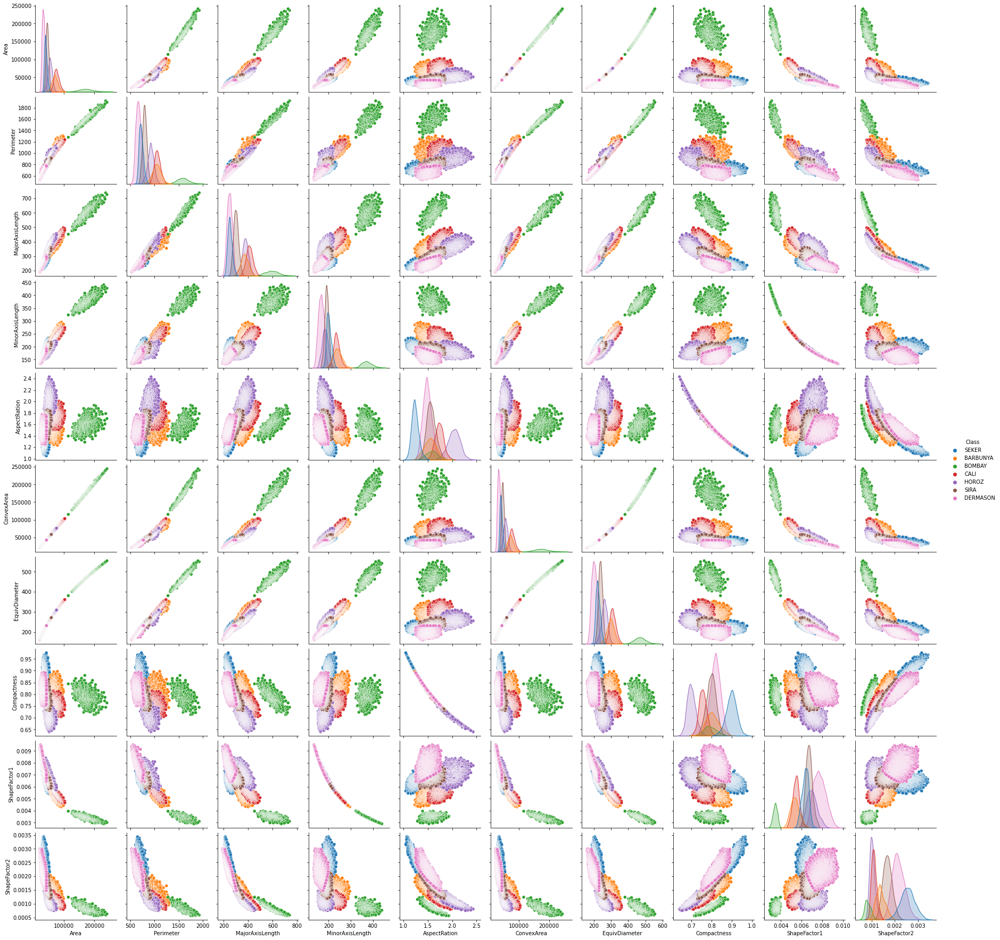

In [82]:
sb.pairplot(df_new, hue="Class");

The data looks a lot better now.

## Classification

In [157]:
X, y = getXy(df_new)

### Helper functions

In [141]:
import sklearn.metrics as metrics

def print_metrics(test_labels, pred_labels, avg=None):
    print("Accuracy Score: {}".format(metrics.accuracy_score(test_labels, pred_labels)))
    print("Precision Score: {}".format(metrics.precision_score(test_labels, pred_labels, average=avg)))
    print("Recall Score: {}".format(metrics.recall_score(test_labels, pred_labels, average=avg)))
    print("F1 Score: {}".format(metrics.f1_score(test_labels, pred_labels, average=avg)))
    print("Confusion matrix:\n{}".format(metrics.confusion_matrix(test_labels, pred_labels)))

In [142]:
def pred_accuracy(clf, X_train, X_test, y_train, y_test):
    train_acc = clf.score(X_train, y_train)
    test_acc = clf.score(X_test, y_test)
    print("Train accuracy score:", train_acc)
    print("Test accuracy score:", test_acc)
    print("Difference:", abs(train_acc - test_acc))

In [143]:
def null_accuracy(pred):
    # null accuracy (accuracy by always guessing the most frequent value)
    counts = pred.value_counts(sort=True)
    print("Null accuracy:", counts[0]/counts.sum())

In [144]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

def classify(name, classifier, iterations=1000, test_size=0.25):
    print(name)
    
    model_accuracies = []
    for repetition in range(iterations):
        (X_train, X_test, y_train, y_test) = train_test_split(X, y, test_size=test_size) # , random_state=1
    
        clf = classifier()
        clf.fit(X_train, y_train)
        y_pred = clf.predict(X_test)
        # append the accuracy for the histogram plotting
        model_accuracies.append(accuracy_score(y_test, y_pred))
    
    # histogram plot of the accuracies
    sb.displot(model_accuracies, kde=True);
    # print all the metrics information
    print_metrics(y_test, y_pred)    
    # check for overfitting
    pred_accuracy(clf, X_train, X_test, y_train, y_test)
    # null accuracy
    null_accuracy(y_test)

### Fitting data

#### Decision tree

Decision tree
Accuracy Score: 0.8954641033343347
Precision Score: [0.85932722 1.         0.8708134  0.89942857 0.9578714  0.92871287
 0.83226837]
Recall Score: [0.85670732 0.9921875  0.88997555 0.89533561 0.94945055 0.92871287
 0.8336    ]
F1 Score: [0.85801527 0.99607843 0.88029021 0.89737742 0.95364238 0.92871287
 0.83293365]
Confusion matrix:
[[281   0  42   0   2   1   2]
 [  1 127   0   0   0   0   0]
 [ 36   0 364   0   7   0   2]
 [  0   0   0 787   0  20  72]
 [  2   0   9   2 432   0  10]
 [  0   0   0  17   0 469  19]
 [  7   0   3  69  10  15 521]]
Train accuracy score: 1.0
Test accuracy score: 0.8954641033343347
Difference: 0.10453589666566532
Null accuracy: 0.26404325623310304


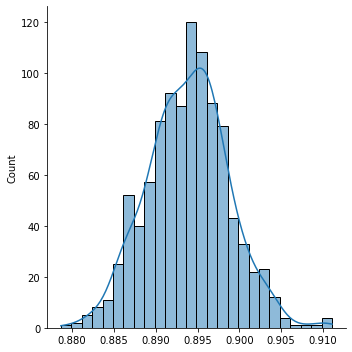

In [145]:
from sklearn.tree import DecisionTreeClassifier

classify("Decision tree", DecisionTreeClassifier)

By analysing the difference on accuracy scores between the test data and train data, we can conclude that **overfitting** is happening: 10% difference and the accuracy using the train data is 100%. Depending on the way we divide the testing and training data, we can get up 4% more (or less) accuracy, which isn't good.

Other than that, the model seems to be doing a good job classifying the model because the null accuracy is much lower than the test accuracy.

#### K-Nearest Neighbors

K-Nearest Neighbors
Accuracy Score: 0.728146590567738
Precision Score: [0.53618421 1.         0.62621359 0.78181818 0.70281996 0.80512821
 0.73082287]
Recall Score: [0.46704871 1.         0.68073879 0.8980344  0.70434783 0.6073501
 0.74857143]
F1 Score: [0.4992343  1.         0.65233881 0.83590623 0.70358306 0.6923925
 0.73959068]
Confusion matrix:
[[163   0 135   0  46   0   5]
 [  0 110   0   0   0   0   0]
 [100   0 258   0  21   0   0]
 [  0   0   0 731   1  47  35]
 [ 38   0  19  14 324   0  65]
 [  0   0   0 111   4 314  88]
 [  3   0   0  79  65  29 524]]
Train accuracy score: 0.8219150641025641
Test accuracy score: 0.728146590567738
Difference: 0.09376847353482609
Null accuracy: 0.24451787323520577


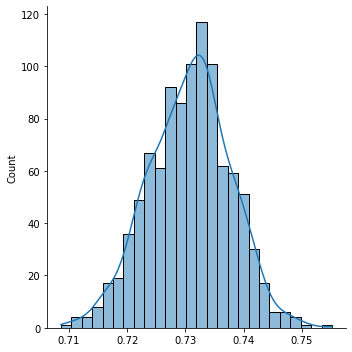

In [147]:
from sklearn.neighbors import KNeighborsClassifier

classify("K-Nearest Neighbors", KNeighborsClassifier)

By analysing the difference on accuracy scores between the test data and train data, we can conclude that **overfitting** is happening: 8% difference in accuracy scores. Depending on the way we divide the testing and training data, we can get up 4% more (or less) accuracy, which isn't good.

This model is also scoring worse than the **Decision Tree model** (80% to 89%), but also *overfits* less too.

Other than that, the model seems to be doing a good job classifying the model because the null accuracy is much lower than the test accuracy.

#### Naive Bayes

Naive Bayes
Accuracy Score: 0.7677981375788525
Precision Score: [0.58       1.         0.70171674 0.87484958 0.81363636 0.7012987
 0.74115756]
Recall Score: [0.51632047 1.         0.7414966  0.83563218 0.79028698 0.74556213
 0.78135593]
F1 Score: [0.54631083 1.         0.72105843 0.8547913  0.80179171 0.72275335
 0.76072607]
Confusion matrix:
[[174   0 123   0  29   0  11]
 [  0 131   0   0   0   0   0]
 [102   0 327   0  12   0   0]
 [  0   0   0 727   0 105  38]
 [ 24   0  16   4 358   0  51]
 [  0   0   0  67   1 378  61]
 [  0   0   0  33  40  56 461]]
Train accuracy score: 0.7715344551282052
Test accuracy score: 0.7677981375788525
Difference: 0.0037363175493526635
Null accuracy: 0.2613397416641634


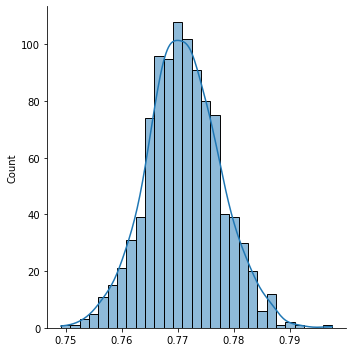

In [146]:
from sklearn.naive_bayes import GaussianNB

classify("Naive Bayes", GaussianNB)

By analysing the difference on accuracy scores between the test data and train data, we can conclude that **no overfitting** is happening. The data is also very independent of the way we divide the testing and training data: pratically 0% variance on the accuracy score.

Although the score is worse than the one we obtained using the **Decision Tree model** (77% to 89%), the results are consistent and there is no overfitting, making this model better.

Other than that, the model seems to be doing a good job classifying the model because the null accuracy is much lower than the test accuracy.

#### Random Forest Classifier

Random Forest Classifier
Accuracy Score: 0.9113848002403124
Precision Score: [0.89783282 1.         0.86666667 0.90218642 0.9569161  0.95112016
 0.87841945]
Recall Score: [0.85294118 1.         0.90231362 0.92235294 0.96567506 0.92842942
 0.86526946]
F1 Score: [0.87481146 1.         0.88413098 0.91215823 0.96127563 0.93963783
 0.87179487]
Confusion matrix:
[[290   0  42   0   2   0   6]
 [  0 142   0   0   0   0   0]
 [ 27   0 351   0  10   0   1]
 [  0   0   0 784   0  17  49]
 [  2   0   7   0 422   0   6]
 [  1   0   0  17   0 467  18]
 [  3   0   5  68   7   7 578]]
Train accuracy score: 0.9998998397435898
Test accuracy score: 0.9113848002403124
Difference: 0.08851503950327733
Null accuracy: 0.2553319315109642


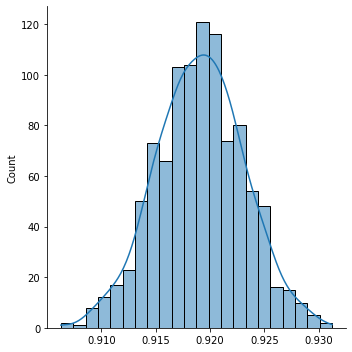

In [148]:
from sklearn.ensemble import RandomForestClassifier

classify("Random Forest Classifier", RandomForestClassifier)

By analysing the difference on accuracy scores between the test data and train data, we can conclude that **overfitting** is happening. The data isn't too dependent of the way we divide the testing and training data: around 2% variance on the accuracy score (on the extremes).

This model obtained a very high accuracy score (highest yet). The results are somewhat consistent, but the model appears to be **overfitting**.

Other than that, the model seems to be doing a good job classifying the model because the null accuracy is much lower than the test accuracy.

### Cross-validation

In [177]:
from sklearn.model_selection import cross_val_score

def cross_validate(classifier):
    clf = classifier()
    # y is multiclass and cv is 10 => Stratified K-Fold with 10 folds will be used
    cv_scores = cross_val_score(clf, X, y, cv=10)
    plt.hist(cv_scores)
    plt.title('Average score: {}'.format(np.mean(cv_scores)));

#### Decision tree

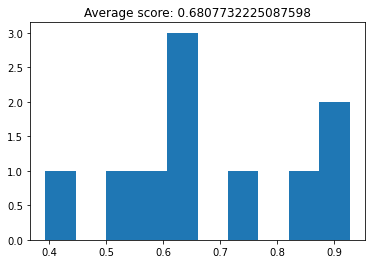

In [178]:
from sklearn.tree import DecisionTreeClassifier

cross_validate(DecisionTreeClassifier)

#### K-Nearest Neighbors

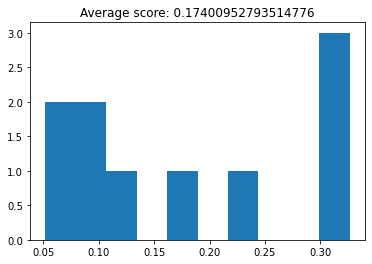

In [170]:
from sklearn.neighbors import KNeighborsClassifier

cross_validate(KNeighborsClassifier)

#### Naive Bayes

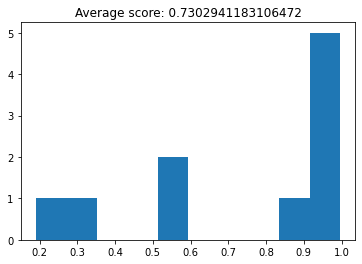

In [171]:
from sklearn.naive_bayes import GaussianNB

cross_validate(GaussianNB)

#### Random Forest Classifier

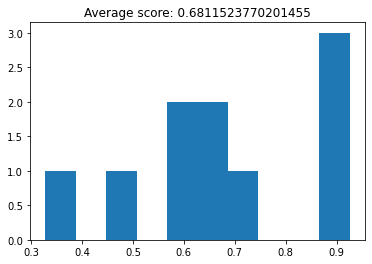

In [172]:
from sklearn.ensemble import RandomForestClassifier

cross_validate(RandomForestClassifier)

### Parameter tuning

In [224]:
from sklearn.model_selection import GridSearchCV, StratifiedKFold

def grid_search(classifier, parameter_grid, cross_validation=StratifiedKFold(n_splits=10)):
    clf = classifier()
    grid_search = GridSearchCV(clf, param_grid=parameter_grid, cv=cross_validation)
    grid_search.fit(X, y)
    # output info
    print("Best score: {}".format(grid_search.best_score_))
    print("Best parameters: {}".format(grid_search.best_params_))
    # return the best classifier
    return grid_search.best_estimator_

#### Decision tree

In [227]:
from sklearn.tree import DecisionTreeClassifier

parameter_grid = {"criterion": ["gini", "entropy"],
                  "splitter": ["best", "random"],
                  "max_depth": [2, 3, 4, 5, 6],
                  "max_features": np.arange(0.2, 1.1, 0.1),
                  "random_state": [0]}
grid_search(DecisionTreeClassifier, parameter_grid)

Best score: 0.8167307991688159
Best parameters: {'criterion': 'entropy', 'max_depth': 6, 'max_features': 0.6000000000000001, 'random_state': 0, 'splitter': 'random'}


DecisionTreeClassifier(criterion='entropy', max_depth=6,
                       max_features=0.6000000000000001, random_state=0,
                       splitter='random')

#### K-Nearest Neighbors

In [225]:
from sklearn.neighbors import KNeighborsClassifier

parameter_grid = {"n_neighbors": [5, 13, 21, 29],
                  "weights": ["uniform", "distance"],
                  "p": [1, 2],
                  "algorithm": ["auto", "ball_tree", "kd_tree", "brute"]}
grid_search(KNeighborsClassifier, parameter_grid)

Best score: 0.20857029080169576
Best parameters: {'algorithm': 'auto', 'n_neighbors': 29, 'p': 1, 'weights': 'uniform'}


KNeighborsClassifier(n_neighbors=29, p=1)

#### Naive Bayes

In [228]:
from sklearn.naive_bayes import GaussianNB

parameter_grid = {"var_smoothing": np.logspace(0, -9, num=100)}
grid_search(GaussianNB, parameter_grid)

Best score: 0.7302941183106472
Best parameters: {'var_smoothing': 1e-09}


GaussianNB()

#### Random Forest Classifier

In [229]:
from sklearn.ensemble import RandomForestClassifier

#"n_estimators": np.arange(50, 201, 50),
parameter_grid = {"criterion": ["gini", "entropy"],
                  "max_depth": [2, 3, 4, 5, 6],
                  "max_features": np.arange(0.2, 1.1, 0.2),
                  "random_state": [0]}
grid_search(RandomForestClassifier, parameter_grid)

Best score: 0.814105145716716
Best parameters: {'criterion': 'entropy', 'max_depth': 4, 'max_features': 0.6000000000000001, 'random_state': 0}


RandomForestClassifier(criterion='entropy', max_depth=4,
                       max_features=0.6000000000000001, random_state=0)